# Modeling (U-Nets)

In [1]:
# import cv2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import rasterio
import shapely.geometry
from sklearn.model_selection import train_test_split
import pickle

import h5py # just a safety check so the checkpoint callback doesnt crash
from scipy.misc import imresize
import tensorflow as tf
print(tf.__version__)

%matplotlib inline

1.2.0


# Dataset

In [2]:
#Directory path to image and mask
train_dir_path = 'training_tiles_1000size/Train'
test_dir_path = 'training_tiles_1000size/Validation'
train_files = [os.path.join(path,f[:f.find('_img.npy')])
             for path,_,files in os.walk(train_dir_path) 
             for f in files if (f.endswith('img.npy'))]
valid_files = [os.path.join(path,f[:f.find('_img.npy')])
             for path,_,files in os.walk(test_dir_path) 
             for f in files if (f.endswith('img.npy'))]

In [ ]:
#Helper functions
def scale_bands(img, lower_pct = 1, upper_pct = 99):
    """
    Rescale the bands of a multichannel image for display
    """
    # Loop through the image bands, rescaling each one
    img_scaled = np.zeros(img.shape, np.uint8)
    
    for i in range(img.shape[2]):
        
        band = img[:, :, i]
        
        # Pick out the lower and upper percentiles
        lower, upper = np.percentile(band, [lower_pct, upper_pct])
        
        # Normalize the band
        band = (band - lower) / (upper - lower) * 255
        
        # Clip the high and low values, and cast to uint8
        img_scaled[:, :, i] = np.clip(band, 0, 255).astype(np.uint8)
        
    return img_scaled

def resize(img, new_shape):
    "Image resize"
    img_resized = np.zeros(new_shape+(img.shape[2],)).astype('float32')
    for i in range(img.shape[2]):
        img_resized[:, :, i] = imresize(img[:, :, i], new_shape, interp='bicubic')
    return img_resized


I'll use a generator function to output input data in batch sizes. I used a generator function because these images are very large and I only had 23 GB of ram so I can't hold all the data at once

In [3]:
def make_set(filez, input_size, batch_size):    
    #Generating training and test set
    while True:
        tile_to_use = np.random.choice(filez, batch_size, replace=False)
        X=[]
        Y=[]
        maskz = []
        for tile_no in tile_to_use:
            img = np.load(tile_no +'_img.npy') #Load image
            img = resize(img, (input_size, input_size)) #Resize image to 256x256

            mask = np.load(tile_no +'_mask.npy') #Load mask
            mask = imresize(mask, (input_size, input_size)) #Resize mask to 256x256
            maskz = mask[..., None]
            X.append(img[None,...])
            Y.append(maskz[None,...])

        # Concatenate the results
        X = np.concatenate(X, axis = 0)
        Y = np.concatenate(Y, axis = 0)

        # Normalize the values of image and mask
        X = X.astype('float32')
        X = (X / X.max() - 0.5) * 2   # put X in range [-1, 1]
        Y = Y.astype('float32') / 255 # put Y in range [0, 1]
        
        #Generator
        yield X, Y

# Training on U-Net 

### Building Model 

I used a U-Net for my prototype because I can train it from scratch and it can still perform well. It is particuarly good at image segmentation. It is basically like Convolutional Neural Net that encode & decodes but can skip connections that are on the same “level". I used the Keras library that is backended by tensorflow.

For metrics, I used Jaccard Similarity to measure how good is the overlap of the predicted segmentation.

Here is the architecture of U-Net:
<img src="Images/UNet_Architecture.png">

In [4]:
# Source: https://github.com/jocicmarko/ultrasound-nerve-segmentation/blob/master/train.py
import keras
from keras import backend as K
from keras.layers import Input, concatenate, Conv2D, MaxPooling2D, Conv2DTranspose, Dropout
from keras.models import Model
from keras.optimizers import Adam

# Set network size params
input_size = 512
INPUT_SIZE = input_size
N_CLASSES = 1
N_CHANNEL = 3

# Define metrics
smooth = 1.
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
def dice_coef_loss(y_true, y_pred):
    # Just put a negative sign in front of an accuracy metric to turn it into a loss to be minimized
    return -dice_coef(y_true, y_pred)
def jacc_coef(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=[0, -1, -2])
    sum_ = K.sum(y_true + y_pred, axis=[0, -1, -2])
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return K.mean(jac)
def jacc_coef_loss(y_true, y_pred):
    return -jacc_coef(y_true, y_pred)
def jacc_coef_int(y_true, y_pred):
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    intersection = K.sum(y_true * y_pred_pos, axis=[0, -1, -2])
    sum_ = K.sum(y_true + y_pred, axis=[0, -1, -2])
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return K.mean(jac)

#Model
def get_unet(lr=0.001):
    inputs = Input((INPUT_SIZE, INPUT_SIZE, N_CHANNEL))
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    drop1 = Dropout(0.2)(pool1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(drop1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    drop2 = Dropout(0.2)(pool2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(drop2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    drop3 = Dropout(0.2)(pool3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    drop4 = Dropout(0.2)(pool4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(drop4)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv5)

    up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(up6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv6)

    up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(up7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

    up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(up8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv8)

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(up9)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv9)

    conv10 = Conv2D(N_CLASSES, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs=[inputs], outputs=[conv10])

    # model.compile(optimizer=Adam(lr=lr), loss=jacc_coef_loss, metrics=[jacc_coef_int])
    model.compile(optimizer=Adam(lr=lr), loss='binary_crossentropy', metrics=[jacc_coef_int])
    # model.compile(optimizer=Adam(lr=lr), loss='binary_crossentropy', metrics=[dice_coef])

    return model

Using TensorFlow backend.


### Training 

In [5]:
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
# https://keras.io/callbacks/#reducelronplateau

# This sets the number of training epochs 
NUM_EPOCHS = 100

# Define callback to save model checkpoints 
if not os.path.exists('unet_checkpoints_2'):
    os.makedirs('unet_checkpoints_2')
model_checkpoint = ModelCheckpoint(os.path.join('unet_checkpoints_2', 'weights.{epoch:02d}-{val_loss:.5f}.hdf5'), monitor='loss', save_best_only=True)

# Define callback to reduce learning rate when learning stagnates. This won't actually kick in with only 5 training epochs
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, epsilon=0.002, cooldown=2)

# TensorBoard visuluaziations... so I can see the learning rate 
from datetime import datetime
now = datetime.now()
logdir = "/tf_logs/tboards_" + now.strftime("%Y%m%d-%H%M%S") + "/"
tensorboard = TensorBoard(log_dir=logdir, histogram_freq=0, write_graph=True, write_images=True)

# Train the model
model = get_unet(0.001)
model.fit_generator(make_set(train_files, input_size, 16), steps_per_epoch=439, epochs=NUM_EPOCHS, verbose=1,  
          callbacks=[model_checkpoint, reduce_lr, tensorboard], validation_data=make_set(valid_files, input_size, 16), validation_steps=32)


Epoch 1/100
439/439 [==============================] - 591s - loss: 0.2734 - jacc_coef_int: 0.0069 - val_loss: 0.2708 - val_jacc_coef_int: 5.8428e-04
Epoch 2/100
439/439 [==============================] - 586s - loss: 0.2259 - jacc_coef_int: 0.1143 - val_loss: 0.2092 - val_jacc_coef_int: 0.0041
Epoch 3/100
439/439 [==============================] - 585s - loss: 0.1987 - jacc_coef_int: 0.2021 - val_loss: 0.1678 - val_jacc_coef_int: 0.0863
Epoch 4/100
439/439 [==============================] - 584s - loss: 0.1879 - jacc_coef_int: 0.2280 - val_loss: 0.1619 - val_jacc_coef_int: 0.0113
Epoch 5/100
439/439 [==============================] - 586s - loss: 0.1832 - jacc_coef_int: 0.2538 - val_loss: 0.1787 - val_jacc_coef_int: 0.1422
Epoch 6/100
141/439 [========>.....................] - ETA: 379s - loss: 0.1753 - jacc_coef_int: 0.2786

ResourceExhaustedError: OOM when allocating tensor with shape[16,64,512,512]
	 [[Node: gradients/conv2d_17/convolution_grad/Conv2DBackpropInput = Conv2DBackpropInput[T=DT_FLOAT, _class=["loc:@conv2d_17/convolution"], data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/gpu:0"](gradients/conv2d_17/convolution_grad/Shape, conv2d_17/kernel/read, gradients/conv2d_17/Relu_grad/ReluGrad)]]

Caused by op u'gradients/conv2d_17/convolution_grad/Conv2DBackpropInput', defined at:
  File "/home/mlt/anaconda2/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/home/mlt/anaconda2/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/ipykernel/kernelapp.py", line 477, in start
    ioloop.IOLoop.instance().start()
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/zmq/eventloop/ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tornado/ioloop.py", line 888, in start
    handler_func(fd_obj, events)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 235, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/ipykernel/ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/ipykernel/zmqshell.py", line 533, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2718, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2828, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-5-7ff8821b3458>", line 27, in <module>
    callbacks=[model_checkpoint, reduce_lr, tensorboard], validation_data=make_set(valid_files, input_size, 16), validation_steps=32)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/legacy/interfaces.py", line 88, in wrapper
    return func(*args, **kwargs)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/engine/training.py", line 1774, in fit_generator
    self._make_train_function()
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/engine/training.py", line 1001, in _make_train_function
    self.total_loss)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/optimizers.py", line 381, in get_updates
    grads = self.get_gradients(loss, params)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/optimizers.py", line 47, in get_gradients
    grads = K.gradients(loss, params)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/backend/tensorflow_backend.py", line 2108, in gradients
    return tf.gradients(loss, variables, colocate_gradients_with_ops=True)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/gradients_impl.py", line 540, in gradients
    grad_scope, op, func_call, lambda: grad_fn(op, *out_grads))
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/gradients_impl.py", line 346, in _MaybeCompile
    return grad_fn()  # Exit early
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/gradients_impl.py", line 540, in <lambda>
    grad_scope, op, func_call, lambda: grad_fn(op, *out_grads))
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/nn_grad.py", line 445, in _Conv2DGrad
    op.get_attr("data_format")),
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 488, in conv2d_backprop_input
    data_format=data_format, name=name)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/framework/op_def_library.py", line 767, in apply_op
    op_def=op_def)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 2506, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 1269, in __init__
    self._traceback = _extract_stack()

...which was originally created as op u'conv2d_17/convolution', defined at:
  File "/home/mlt/anaconda2/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
[elided 16 identical lines from previous traceback]
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2718, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2822, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-5-7ff8821b3458>", line 21, in <module>
    model = get_unet(0.001)
  File "<ipython-input-4-d9bff0961e47>", line 81, in get_unet
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(up9)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/engine/topology.py", line 554, in __call__
    output = self.call(inputs, **kwargs)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/layers/convolutional.py", line 164, in call
    dilation_rate=self.dilation_rate)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/keras/backend/tensorflow_backend.py", line 2862, in conv2d
    data_format='NHWC')
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 670, in convolution
    op=op)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 338, in with_space_to_batch
    return op(input, num_spatial_dims, padding)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 662, in op
    name=name)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 131, in _non_atrous_convolution
    name=name)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 399, in conv2d
    data_format=data_format, name=name)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/framework/op_def_library.py", line 767, in apply_op
    op_def=op_def)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 2506, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/mlt/anaconda2/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 1269, in __init__
    self._traceback = _extract_stack()

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[16,64,512,512]
	 [[Node: gradients/conv2d_17/convolution_grad/Conv2DBackpropInput = Conv2DBackpropInput[T=DT_FLOAT, _class=["loc:@conv2d_17/convolution"], data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/gpu:0"](gradients/conv2d_17/convolution_grad/Shape, conv2d_17/kernel/read, gradients/conv2d_17/Relu_grad/ReluGrad)]]


# View some output

In [7]:
# If you need to load the model, you can use these lines.  Change the weights filename to match one you have.
model = get_unet()
model.load_weights('unet_checkpoints_2/weights.46-0.11154.hdf5')

In [8]:
from sklearn.metrics import jaccard_similarity_score
def jacc_coef_int(y_true, y_pred):
    y_pred_pos = y_pred
    intersection = np.sum(y_true * y_pred_pos)
    sum_ = np.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return np.mean(jac)

# Function to create an iterator with examples
def get_examples():
    for i in range(Y_val.shape[0]):
        if Y_val[i, ...].sum() > 3000:
            X = X_val[i]
            Y = Y_val[i]
            yield X, Y

# Function to plot a single example
def plot_example(X, Y, model):
    # Apply the model to this example
    prediction = model.predict(X[None, ...])[0, ...] > 0.15
    prediction = prediction * 1
    
    fig, axes = plt.subplots(1, 3, figsize=(10,10))
    
    # Iterate through each target class
    for tno in range(1):
        targ = Y[:, :, tno]
        pred = prediction[:, :, tno]
        
        jaccard_score1 = jaccard_similarity_score(targ.astype('uint8'),pred.astype('uint8'))
        jaccard_score2 = jacc_coef_int(targ,pred)
        # plt.suptitle('Jaccard Sim (SKlearn): '+ str(jaccard_score1)+' | Jaccard Sim (Custom): '+ str(jaccard_score2),size=18)
        plt.suptitle('Jaccard Sim (Custom): '+ str(jaccard_score2),size=18,color='w')
        
        ax1, ax2, ax3 = axes[:]

        ax1.imshow(scale_bands(X[:, :, :])) # This index starts at 0, so I had to decrement
        ax2.imshow(targ, vmin=0, vmax=1, cmap=plt.cm.gray)
        ax3.imshow(pred, vmin=0, vmax=1, cmap=plt.cm.gray)
        
        ax1.set_title('Image',color='w')
        ax2.set_title('Ground Truth',color='w')
        ax3.set_title('Prediction',color='w')
        
        fig.tight_layout()
        plt.subplots_adjust(top=1.55)
    
    plt.show()

example_generator = get_examples()


The predictions aren't good, but then again, so are the original ground truth. Interestingly, sometimes the predictions are picking out the flood a lot better than the ground truth, which hints that there is a latent protential to do more work.

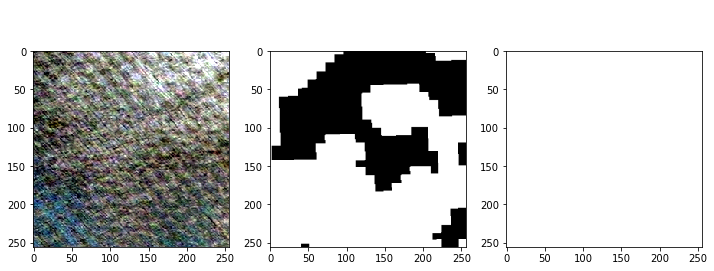

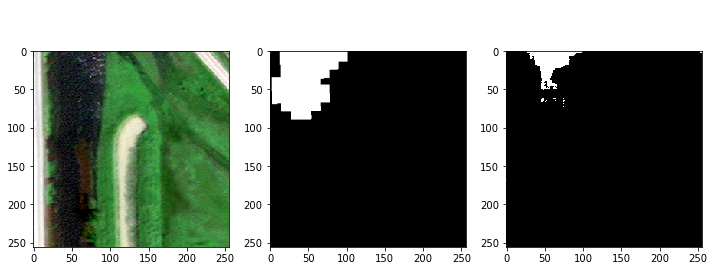

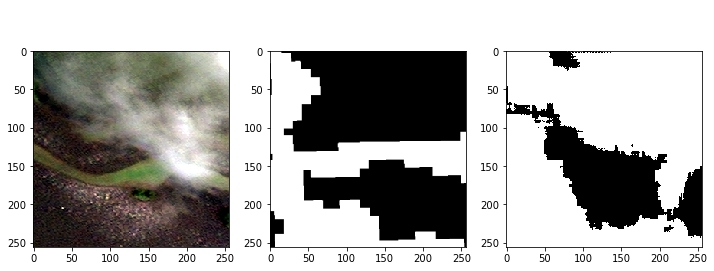

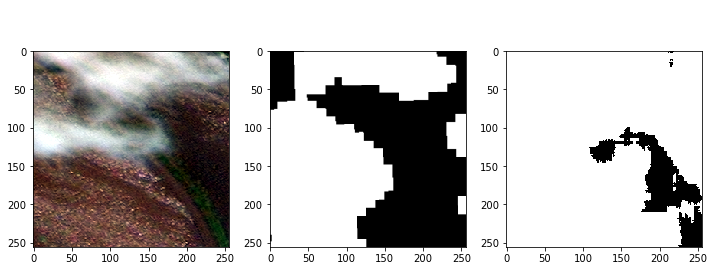

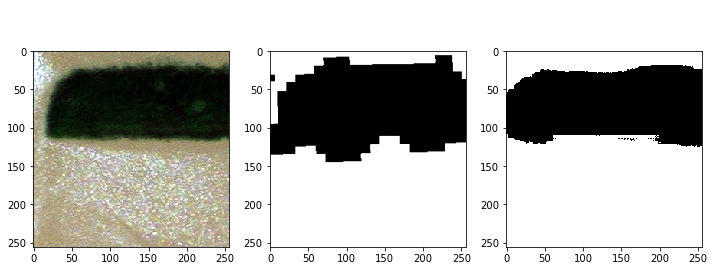

...

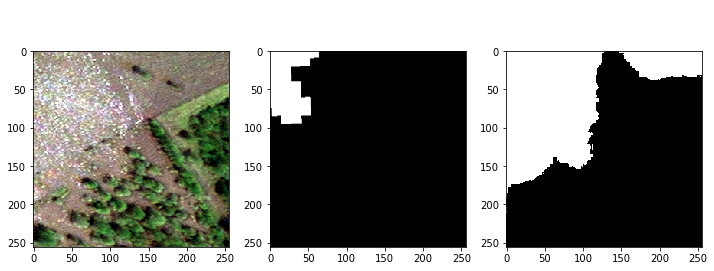

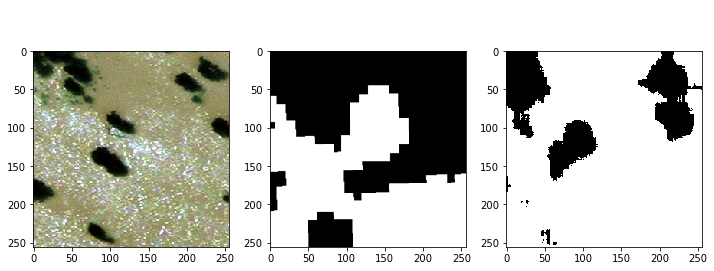

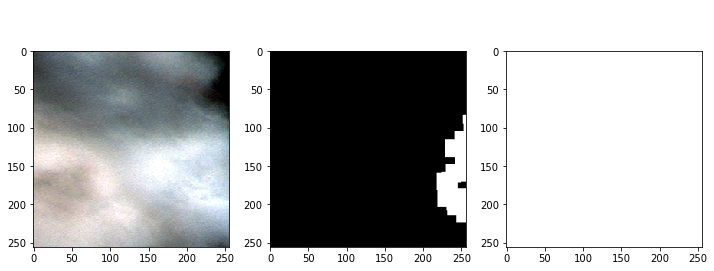

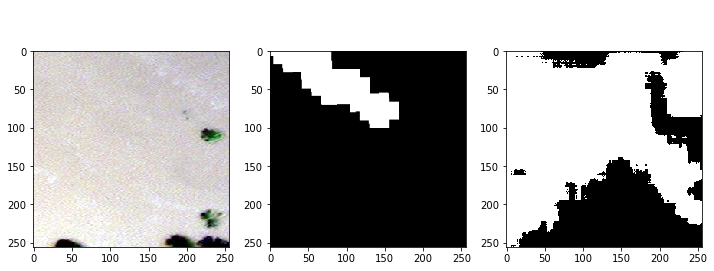

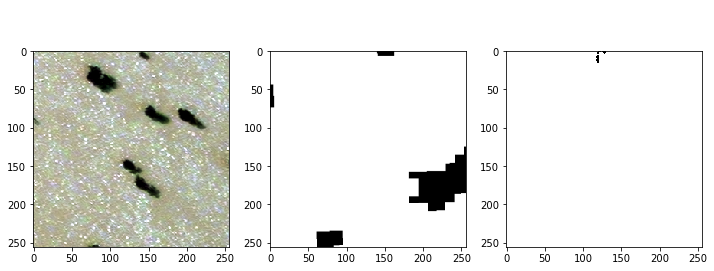

In [21]:
i = 0
while i < 100:
    X, Y = next(example_generator)
    plot_example(X, Y, model)
    i+= 1

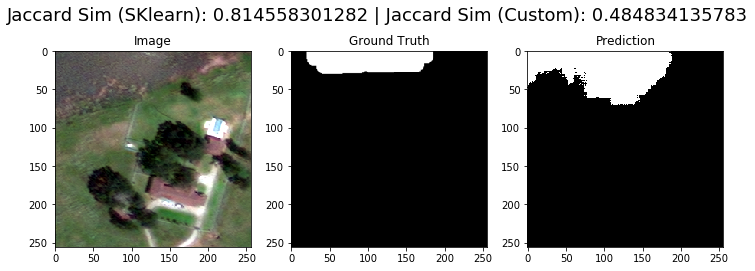

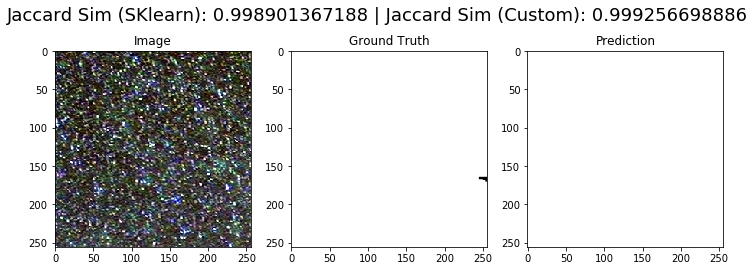

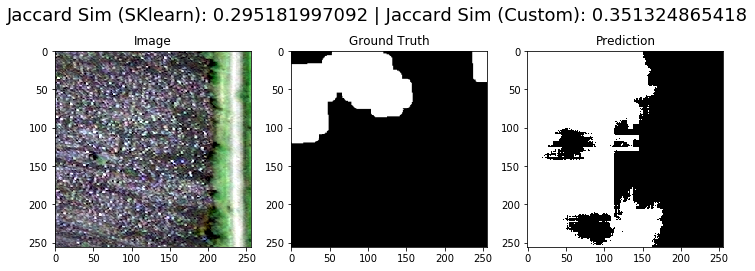

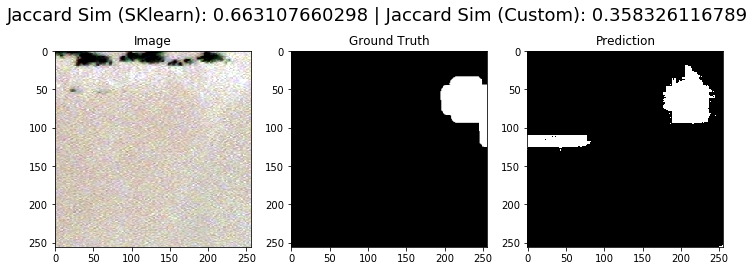

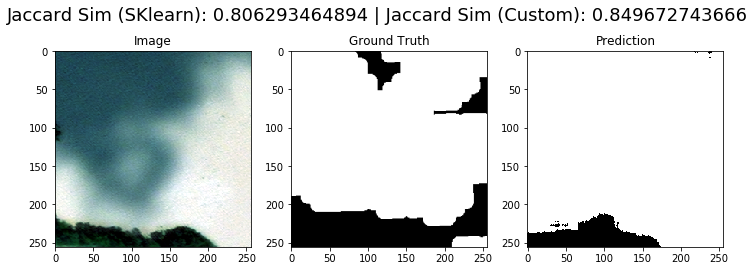

...

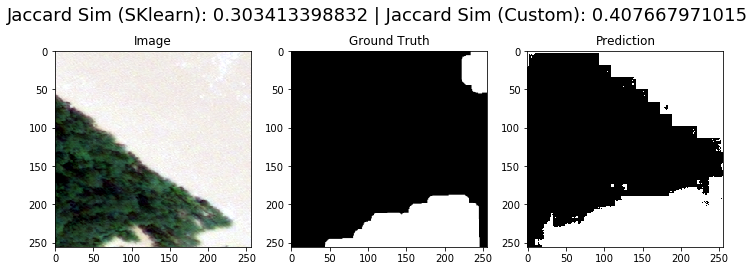

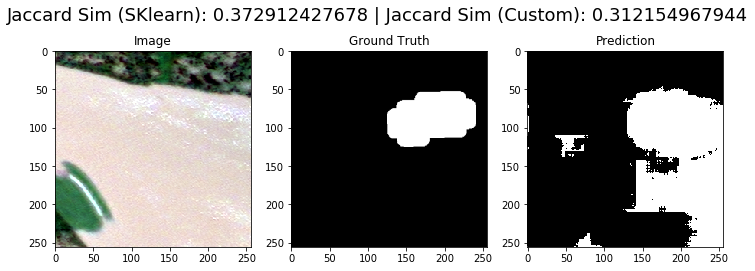

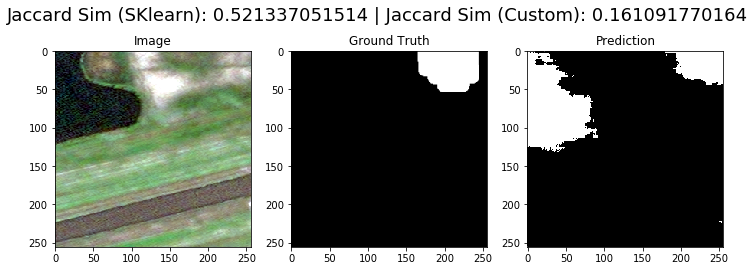

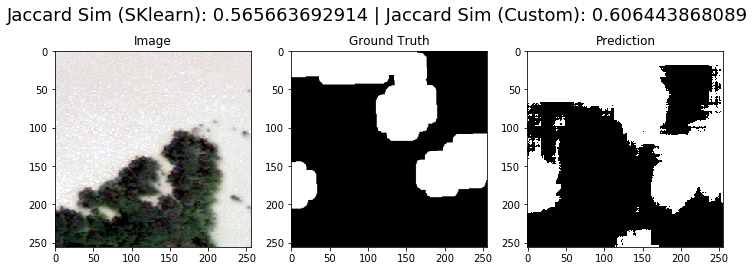

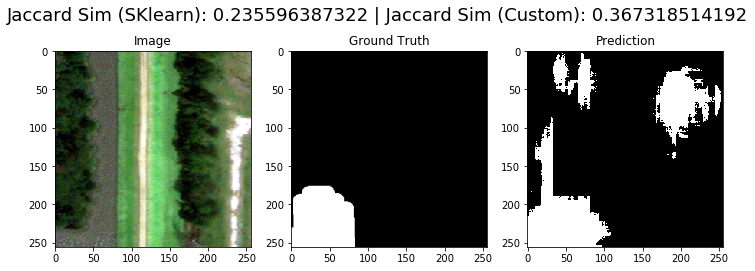

In [45]:
i = 0
while i < 20:
    X, Y = next(example_generator)
    plot_example(X, Y, model)
    i+= 1

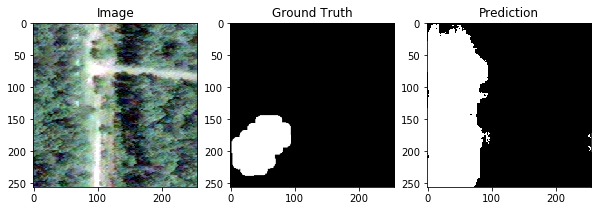

In [19]:
X, Y = next(example_generator)
plot_example(X, Y, model)

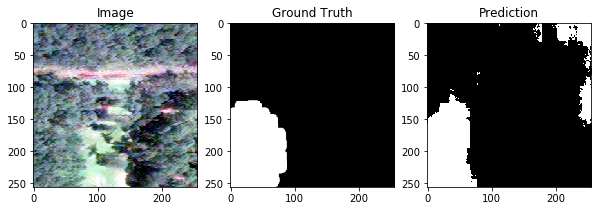

In [20]:
X, Y = next(example_generator)
plot_example(X, Y, model)

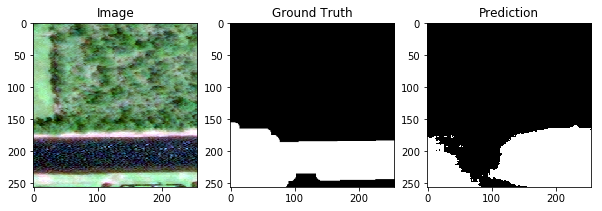

In [22]:
X, Y = next(example_generator)
plot_example(X, Y, model)

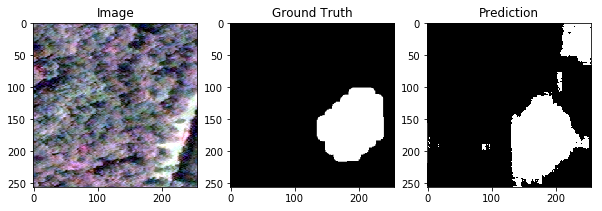

In [23]:
X, Y = next(example_generator)
plot_example(X, Y, model)

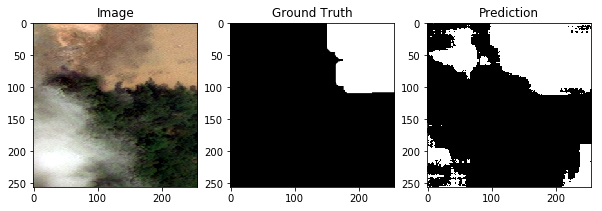

In [24]:
X, Y = next(example_generator)
plot_example(X, Y, model)

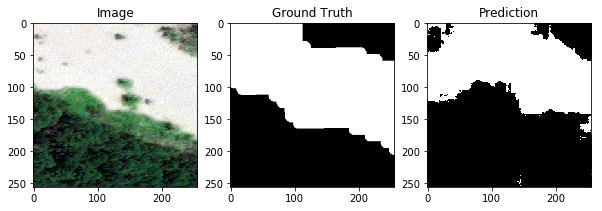

In [25]:
X, Y = next(example_generator)
plot_example(X, Y, model)

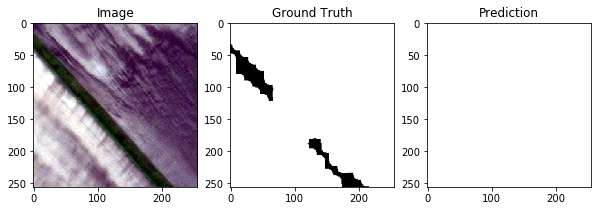

In [26]:
X, Y = next(example_generator)
plot_example(X, Y, model)

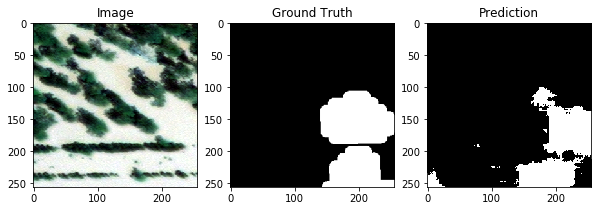

In [27]:
X, Y = next(example_generator)
plot_example(X, Y, model)

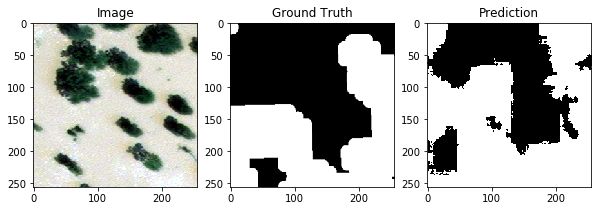

In [28]:
X, Y = next(example_generator)
plot_example(X, Y, model)

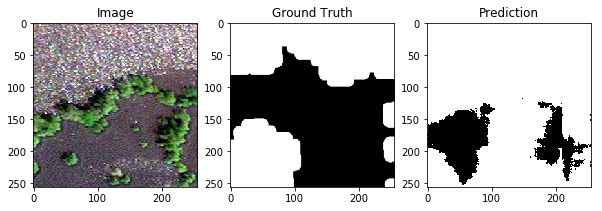

In [29]:
X, Y = next(example_generator)
plot_example(X, Y, model)